In [1]:
import torch
import torch.nn.functional as F
from torch.utils.data import Dataset
import pytorch_lightning as pl
import segmentation_models_pytorch as smp
from datasets import load_dataset
from torch.utils.data import random_split
from torchvision.transforms import v2
from collections import defaultdict
import pandas as pd
import matplotlib.pyplot as plt
import os
import random

In [2]:
ds = load_dataset("urbanstevie/reference_dataset")

Repo card metadata block was not found. Setting CardData to empty.


In [3]:
from utilities import set_seed
set_seed(42)

42

## Sprinkles method got from:
[Here](https://github.com/jcgy/sprinkles)

In [7]:
def sprinkles(
    img,
    size,
    perc,
    channels=3,
    mode="random",
    width=2,
):
    """
    img: torch.Tensor of shape (C, H, W), values in [0, 1]
    mode: "random" | "grid" | "diagonals"
    size:
        - random: sprinkle square size
        - grid/diagonals: spacing between lines
    perc:
        - random: percentage of pixels to affect
        - grid/diagonals: ignored (kept for API consistency)
    width: line thickness for grid/diagonals
    """

    x = img.clone()
    C, H, W = x.shape

    mask = torch.zeros((1, H, W), dtype=torch.float32)

    # RANDOM (original behavior)
    if mode == "random":
        number_of_pixels_to_change = int(perc * H * W)
        number_of_sprinkles = max(1, number_of_pixels_to_change // (size * size))

        for _ in range(number_of_sprinkles):
            y = torch.randint(0, H - size, (1,)).item()
            x0 = torch.randint(0, W - size, (1,)).item()

            x[:, y:y + size, x0:x0 + size] = 0.0
            mask[:, y:y + size, x0:x0 + size] = 1.0

    # GRID (vertical + horizontal lines)
    elif mode == "grid":
        for y in range(0, H, size):
            y_end = min(y + width, H)
            x[:, y:y_end, :] = 0.0
            mask[:, y:y_end, :] = 1.0

        for x0 in range(0, W, size):
            x_end = min(x0 + width, W)
            x[:, :, x0:x_end] = 0.0
            mask[:, :, x0:x_end] = 1.0

    # DIAGONALS (both directions)
    elif mode == "diagonals":
        for offset in range(-H, W, size):
            for w in range(width):
                # main diagonal \
                y = torch.arange(H)
                x_diag = y + offset + w
                valid = (x_diag >= 0) & (x_diag < W)
                x[:, y[valid], x_diag[valid]] = 0.0
                mask[:, y[valid], x_diag[valid]] = 1.0

                # anti-diagonal /
                x_anti = (W - 1 - y) + offset + w
                valid = (x_anti >= 0) & (x_anti < W)
                x[:, y[valid], x_anti[valid]] = 0.0
                mask[:, y[valid], x_anti[valid]] = 1.0

    else:
        raise ValueError(f"Unknown mode: {mode}")

    return x, img, mask


In [8]:
class HFImageDataset(Dataset):
    def __init__(self, hf_dataset, transforms=None, sprinkles_mode='random'):
        self.dataset = hf_dataset
        self.transforms = transforms
        self.sprinkles_mode = sprinkles_mode
    
    def __len__(self):
        return len(self.dataset)
    
    def __getitem__(self, idx):
        item = self.dataset[idx]
        image = item['image']  # PIL Image
        
        if self.transforms:
            image = self.transforms(image)
        
        # Create masked version
        masked_image, original_image, mask = sprinkles(image, size=10, perc=0.15, mode = self.sprinkles_mode)
        
        return {
            'masked_image': masked_image,  # X - input to U-Net
            'original_image': original_image,  # Y - target for U-Net
            'mask': mask  # Optional: can be used for masked loss
        }


# DataModule
class DataModule(pl.LightningDataModule):
    def __init__(self, dataset_name, bs, train_split=0.70, val_split=0.15, test_split=0.15, num_workers=4, sprinkles_mode = 'random'):
        super().__init__()
        self.dataset_name = dataset_name
        self.bs = bs
        self.train_split = train_split
        self.val_split = val_split
        self.test_split = test_split
        self.num_workers = num_workers
        self.sprinkles_mode = sprinkles_mode
    
    def setup(self, stage=None):
        # Load dataset
        ds = load_dataset(self.dataset_name)
        
        # If dataset has splits, use them
        if 'train' in ds and 'test' in ds:
            full_train = ds['train']
            self.test_data = ds['test']
            
            # Split train into train/val
            train_size = int(self.train_split / (self.train_split + self.val_split) * len(full_train))
            val_size = len(full_train) - train_size
            train_data, val_data = random_split(full_train, [train_size, val_size])
            
        else:
            # No predefined splits, create our own
            full_dataset = ds['train'] if 'train' in ds else ds[list(ds.keys())[0]]
            total_size = len(full_dataset)
            train_size = int(self.train_split * total_size)
            val_size = int(self.val_split * total_size)
            test_size = total_size - train_size - val_size
            
            train_data, val_data, test_data = random_split(
                full_dataset, 
                [train_size, val_size, test_size]
            )
            self.test_data = test_data
        
        # Define transforms
        rgb_transforms = v2.Compose([
            v2.ToImage(), 
            v2.Resize(256),
            v2.CenterCrop(224),
            v2.ToDtype(torch.float32, scale=True),
            v2.Normalize(
                mean=[0.34437724, 0.38029198, 0.40777111], 
                std=[0.20265734, 0.13689059, 0.11554374]
            )
        ])
        
        # Create datasets with cutouts
        self.train_ds = HFImageDataset(
            train_data, 
            transforms=rgb_transforms,
            sprinkles_mode = self.sprinkles_mode
        )
        self.valid_ds = HFImageDataset(
            val_data, 
            transforms=rgb_transforms,
            sprinkles_mode = self.sprinkles_mode
        )
        self.test_ds = HFImageDataset(
            test_data, 
            transforms=rgb_transforms,
            sprinkles_mode = self.sprinkles_mode
        )
    
    def train_dataloader(self):
        return torch.utils.data.DataLoader(
            self.train_ds, 
            batch_size=self.bs, 
            shuffle=True, 
            num_workers=self.num_workers
        )
    
    def val_dataloader(self):
        return torch.utils.data.DataLoader(
            self.valid_ds, 
            batch_size=self.bs, 
            shuffle=False, 
            num_workers=self.num_workers
        )
    
    def test_dataloader(self):
        return torch.utils.data.DataLoader(
            self.test_ds, 
            batch_size=self.bs, 
            shuffle=False, 
            num_workers=self.num_workers
        )

Repo card metadata block was not found. Setting CardData to empty.
Repo card metadata block was not found. Setting CardData to empty.
Repo card metadata block was not found. Setting CardData to empty.


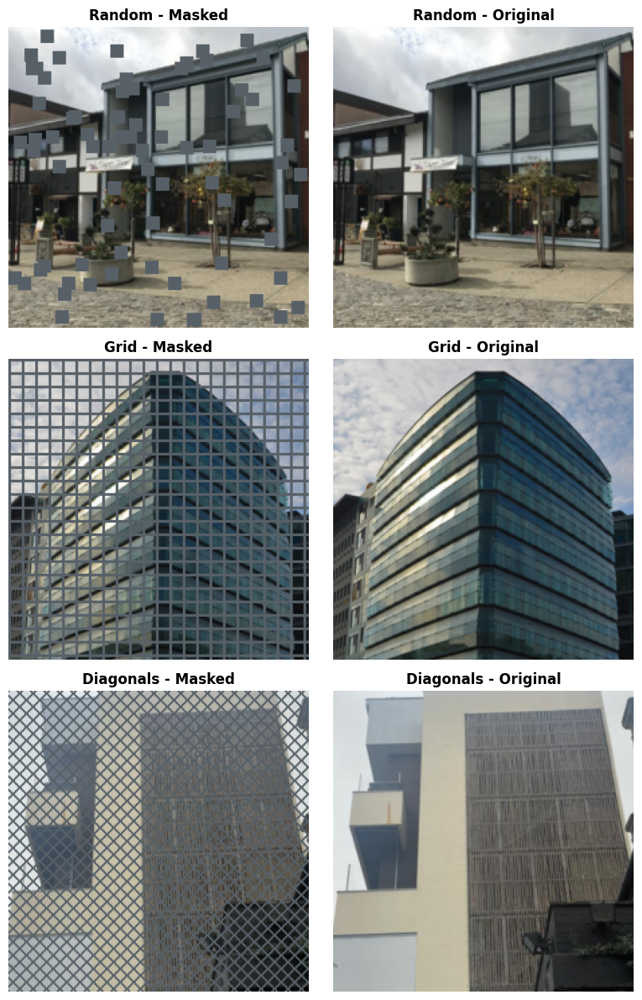

Visualization saved to 'all_sprinkle_patterns.png'
Patterns shown: random, grid, diagonals


In [9]:
# List of all sprinkle modes
sprinkle_modes = ["random", "grid", "diagonals"]

# Denormalization parameters
mean = torch.tensor([0.34437724, 0.38029198, 0.40777111]).view(3, 1, 1)
std = torch.tensor([0.20265734, 0.13689059, 0.11554374]).view(3, 1, 1)

# Create figure with subplots for all modes
fig, axes = plt.subplots(len(sprinkle_modes), 2, figsize=(8, 4*len(sprinkle_modes)))

for mode_idx, mode in enumerate(sprinkle_modes):
    # Create DataModule with specific sprinkle mode
    dm = DataModule(
        dataset_name="urbanstevie/reference_dataset", 
        bs=32,
        sprinkles_mode=mode
    )
    dm.setup()
    
    # Get one sample
    sample = dm.train_ds[0]
    
    # Get masked and original images
    masked_image = sample['masked_image']
    original_image = sample['original_image']
    
    # Denormalize for visualization
    masked_denorm = masked_image * std + mean
    original_denorm = original_image * std + mean
    
    # Clamp to valid range
    masked_denorm = torch.clamp(masked_denorm, 0, 1)
    original_denorm = torch.clamp(original_denorm, 0, 1)
    
    # Convert to numpy for plotting
    masked_np = masked_denorm.permute(1, 2, 0).numpy()
    original_np = original_denorm.permute(1, 2, 0).numpy()
    
    # Left column: masked images (with cutouts)
    axes[mode_idx, 0].imshow(masked_np)
    axes[mode_idx, 0].axis('off')
    axes[mode_idx, 0].set_title(f'{mode.capitalize()} - Masked', fontsize=12, fontweight='bold')
    
    # Right column: original images (ground truth)
    axes[mode_idx, 1].imshow(original_np)
    axes[mode_idx, 1].axis('off')
    axes[mode_idx, 1].set_title(f'{mode.capitalize()} - Original', fontsize=12, fontweight='bold')

plt.tight_layout()
plt.savefig('all_sprinkle_patterns.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"Visualization saved to 'all_sprinkle_patterns.png'")
print(f"Patterns shown: {', '.join(sprinkle_modes)}")

In [10]:
class LightningModule(pl.LightningModule):
    def __init__(self, learning_rate=1e-3):
        super().__init__()
        self.save_hyperparameters()
        
        # Creating model
        self.model = smp.Unet(
            encoder_name='resnet50',
            encoder_weights='imagenet',
            in_channels=4,
            classes=3 #rgb 
        )

        self.training_step_outputs = defaultdict(float)
        self.validation_step_outputs = defaultdict(float)
        
    def forward(self, x):
        return self.model(x)

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=self.hparams.learning_rate)
        return {"optimizer": optimizer}

    def training_step(self, batch, batch_idx):
        #Version 1 -> 3 channels + Mask (4 channels) 
        x_simple = batch['masked_image']
        y = batch['original_image']
        mask = batch['mask']

        # Ensure mask has channel dimension
        if mask.dim() == 3:
            mask = mask.unsqueeze(1)  # [B, H, W] -> [B, 1, H, W]
        
        # Concatenate along channel dimension
        x = torch.cat([x_simple, mask], dim=1)  # Shape: [B, 4, H, W]

        y_hat = self(x)

        loss = F.l1_loss(y_hat, y)

        # loss = (F.l1_loss(y_hat, y, reduction='none') * mask).sum() / (mask.sum() + 1e-8)
        
        self.log('train_loss', loss, on_step=False, on_epoch=True, prog_bar=True)
        self.training_step_outputs['loss'] += loss.detach().cpu()
        self.training_step_outputs['steps'] += 1
        
        return loss

    def validation_step(self, batch, batch_idx):
        x_simple = batch['masked_image']
        y = batch['original_image']
        mask = batch['mask']

        # Concatenate along channel dimension
        x = torch.cat([x_simple, mask], dim=1)  # Shape: [B, 4, H, W]

        y_hat = self(x)

        loss = F.l1_loss(y_hat, y)

        # loss = (F.l1_loss(y_hat, y, reduction='none') * mask).sum() / (mask.sum() + 1e-8)
        
        self.log('val_loss', loss, on_step=False, on_epoch=True, prog_bar=True)
        self.validation_step_outputs['loss'] += loss.detach().cpu()
        self.validation_step_outputs['steps'] += 1
        
        return loss

    def on_train_epoch_end(self): 
        avg_loss = self.training_step_outputs['loss'] / self.training_step_outputs['steps']
        print(f"Average training loss for epoch {self.current_epoch}: {avg_loss.item():.4f}")
        self.training_step_outputs.clear() 

    def on_validation_epoch_end(self):
        avg_loss = self.validation_step_outputs['loss'] / self.validation_step_outputs['steps']
        print(f"Average validation loss for epoch {self.current_epoch}: {avg_loss.item():.4f}")
        self.validation_step_outputs.clear() 

In [11]:
from lightning.pytorch.loggers import CSVLogger

sprinkle_modes = ["random", "grid", "diagonals"]

# Train a model for each sprinkle mode
for mode in sprinkle_modes:
    print(f"\n{'='*60}")
    print(f"Training model with sprinkle mode: {mode.upper()}")
    print(f"{'='*60}\n")
    
    # Set seed for reproducibility
    pl.seed_everything(seed=42, workers=True)
    
    # Initialize model
    lightning_module = LightningModule(learning_rate=1e-3)
    
    # Logger with mode-specific directory
    csv_logger = CSVLogger(
        save_dir=os.getcwd(), 
        name=f"denoising_mode_{mode}"
    )
    
    # Checkpoint callback
    model_checkpoint_callback = pl.callbacks.ModelCheckpoint(
        monitor='val_loss', 
        mode='min', 
        filename='best_valid_loss', 
        verbose=True, 
        save_last=False
    )
    
    # Trainer
    trainer = pl.Trainer(
        max_epochs=5, 
        logger=csv_logger, 
        callbacks=[model_checkpoint_callback]
    )
    
    # Data module with specific sprinkle mode
    dm = DataModule(
        dataset_name="urbanstevie/reference_dataset", 
        bs=32,
        sprinkles_mode=mode
    )
    dm.setup()
    
    # Train
    trainer.fit(lightning_module, dm)
    
    print(f"\n✓ Completed training for mode: {mode}")
    print(f"  Model saved to: denoising_4_channels_{mode}/")

print(f"\n{'='*60}")
print("All models trained successfully!")
print(f"{'='*60}")

Seed set to 42



Training model with sprinkle mode: RANDOM



GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
Repo card metadata block was not found. Setting CardData to empty.
You are using a CUDA device ('NVIDIA RTX PRO 6000 Blackwell Max-Q Workstation Edition') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
Repo card metadata block was not found. Setting CardData to empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type | Params | Mode 
---------------------------------------
0 | model | Unet | 32.5 M | train
---------------------------------------
32.5 M    Trainable params
0         Non-trainable params
32.5 M    Total params
130.098   Total estimated model params size (MB)
223       Modules in train mode
0

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Average validation loss for epoch 0: 1.4848


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 0, global step 115: 'val_loss' reached 0.32666 (best 0.32666), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/denoising_mode_random/version_0/checkpoints/best_valid_loss.ckpt' as top 1


Average validation loss for epoch 0: 0.3259
Average training loss for epoch 0: 0.4633


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 1, global step 230: 'val_loss' was not in top 1


Average validation loss for epoch 1: 0.4092
Average training loss for epoch 1: 0.2920


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 2, global step 345: 'val_loss' was not in top 1


Average validation loss for epoch 2: 0.4222
Average training loss for epoch 2: 0.2670


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 3, global step 460: 'val_loss' reached 0.25129 (best 0.25129), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/denoising_mode_random/version_0/checkpoints/best_valid_loss.ckpt' as top 1


Average validation loss for epoch 3: 0.2509
Average training loss for epoch 3: 0.2499


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 575: 'val_loss' was not in top 1
`Trainer.fit` stopped: `max_epochs=5` reached.


Average validation loss for epoch 4: 0.2616
Average training loss for epoch 4: 0.2335


Seed set to 42



✓ Completed training for mode: random
  Model saved to: denoising_4_channels_random/

Training model with sprinkle mode: GRID



GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
Repo card metadata block was not found. Setting CardData to empty.
Repo card metadata block was not found. Setting CardData to empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type | Params | Mode 
---------------------------------------
0 | model | Unet | 32.5 M | train
---------------------------------------
32.5 M    Trainable params
0         Non-trainable params
32.5 M    Total params
130.098   Total estimated model params size (MB)
223       Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Average validation loss for epoch 0: 1.4785


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 0, global step 115: 'val_loss' reached 0.41420 (best 0.41420), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/denoising_mode_grid/version_0/checkpoints/best_valid_loss.ckpt' as top 1


Average validation loss for epoch 0: 0.4160
Average training loss for epoch 0: 0.4647


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 1, global step 230: 'val_loss' was not in top 1


Average validation loss for epoch 1: 7.2052
Average training loss for epoch 1: 0.3055


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 2, global step 345: 'val_loss' reached 0.25863 (best 0.25863), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/denoising_mode_grid/version_0/checkpoints/best_valid_loss.ckpt' as top 1


Average validation loss for epoch 2: 0.2585
Average training loss for epoch 2: 0.2855


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 3, global step 460: 'val_loss' was not in top 1


Average validation loss for epoch 3: 0.2723
Average training loss for epoch 3: 0.2671


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 575: 'val_loss' reached 0.22002 (best 0.22002), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/denoising_mode_grid/version_0/checkpoints/best_valid_loss.ckpt' as top 1


Average validation loss for epoch 4: 0.2202
Average training loss for epoch 4: 0.2524


`Trainer.fit` stopped: `max_epochs=5` reached.
Seed set to 42



✓ Completed training for mode: grid
  Model saved to: denoising_4_channels_grid/

Training model with sprinkle mode: DIAGONALS



GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
Repo card metadata block was not found. Setting CardData to empty.
Repo card metadata block was not found. Setting CardData to empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type | Params | Mode 
---------------------------------------
0 | model | Unet | 32.5 M | train
---------------------------------------
32.5 M    Trainable params
0         Non-trainable params
32.5 M    Total params
130.098   Total estimated model params size (MB)
223       Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Average validation loss for epoch 0: 1.4797


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 0, global step 115: 'val_loss' reached 0.34709 (best 0.34709), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/denoising_mode_diagonals/version_0/checkpoints/best_valid_loss.ckpt' as top 1


Average validation loss for epoch 0: 0.3455
Average training loss for epoch 0: 0.4545


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 1, global step 230: 'val_loss' reached 0.28017 (best 0.28017), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/denoising_mode_diagonals/version_0/checkpoints/best_valid_loss.ckpt' as top 1


Average validation loss for epoch 1: 0.2801
Average training loss for epoch 1: 0.2776


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 2, global step 345: 'val_loss' reached 0.22092 (best 0.22092), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/denoising_mode_diagonals/version_0/checkpoints/best_valid_loss.ckpt' as top 1


Average validation loss for epoch 2: 0.2206
Average training loss for epoch 2: 0.2509


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 3, global step 460: 'val_loss' was not in top 1


Average validation loss for epoch 3: 0.2288
Average training loss for epoch 3: 0.2387


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 575: 'val_loss' reached 0.18584 (best 0.18584), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/denoising_mode_diagonals/version_0/checkpoints/best_valid_loss.ckpt' as top 1


Average validation loss for epoch 4: 0.1856
Average training loss for epoch 4: 0.2284


`Trainer.fit` stopped: `max_epochs=5` reached.



✓ Completed training for mode: diagonals
  Model saved to: denoising_4_channels_diagonals/

All models trained successfully!


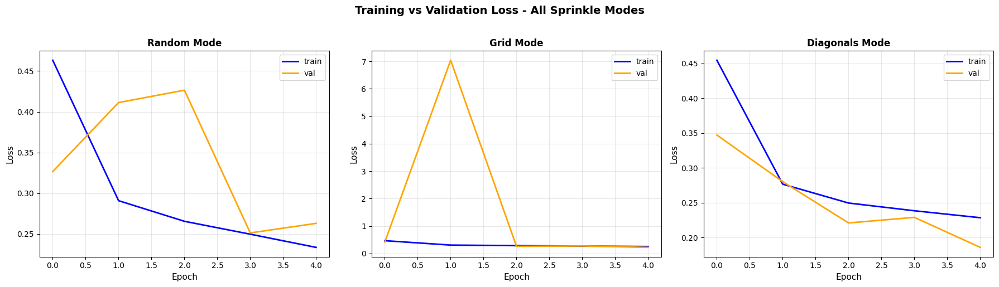

Training curves saved to 'training_curves_comparison.png'

Final Losses Summary:
------------------------------------------------------------
Random       - Train: 0.2335 | Val: 0.2630
Grid         - Train: 0.2525 | Val: 0.2200
Diagonals    - Train: 0.2284 | Val: 0.1858


In [15]:
sprinkle_modes = ["random", "grid", "diagonals"]

# Create subplots for all modes
fig, axes = plt.subplots(1, len(sprinkle_modes), figsize=(18, 5))

for idx, mode in enumerate(sprinkle_modes):
    # Read metrics CSV for this mode
    log_dir = f'denoising_mode_{mode}/version_0'
    metric_df = pd.read_csv(f'{log_dir}/metrics.csv')
    metric_df = metric_df.groupby('epoch', as_index=False).first()
    
    # Plot train and validation loss
    metric_df.train_loss.plot(ax=axes[idx], color='blue', label='train', linewidth=2)
    metric_df.val_loss.plot(ax=axes[idx], color='orange', label='val', linewidth=2)
    
    axes[idx].set_xlabel('Epoch', fontsize=11)
    axes[idx].set_ylabel('Loss', fontsize=11)
   # axes[idx].set_ylim([0, 1])
    axes[idx].set_title(f'{mode.capitalize()} Mode', fontsize=12, fontweight='bold')
    axes[idx].legend(loc='upper right')
    axes[idx].grid(True, alpha=0.3)

plt.suptitle('Training vs Validation Loss - All Sprinkle Modes', fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig('training_curves_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

print("Training curves saved to 'training_curves_comparison.png'")

# Optional: Print final losses for comparison
print("\nFinal Losses Summary:")
print("-" * 60)
for mode in sprinkle_modes:
    log_dir = f'denoising_mode_{mode}/version_0'
    metric_df = pd.read_csv(f'{log_dir}/metrics.csv')
    metric_df = metric_df.groupby('epoch', as_index=False).first()
    
    final_train = metric_df.train_loss.iloc[-1]
    final_val = metric_df.val_loss.iloc[-1]
    
    print(f"{mode.capitalize():12} - Train: {final_train:.4f} | Val: {final_val:.4f}")

In [ ]:
# Load the best model
model = LightningModule.load_from_checkpoint(model_checkpoint_callback.best_model_path)
model.cuda(0) # Move to GPU
model.eval()

LightningModule(
  (model): Unet(
    (encoder): ResNetEncoder(
      (conv1): Conv2d(4, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReL

In [18]:
def denormalize(img, mean, std):
    """Denormalize image for visualization"""
    img = img.clone()
    for i in range(3):
        img[i] = img[i] * std[i] + mean[i]
    return img.clamp(0, 1)

def visualize_inpainting(model, dataloader, device='cuda', num_images=4):
    """
    Visualize inpainting results
    
    Args:
        model: Trained PyTorch Lightning model
        dataloader: DataLoader with test/validation data
        device: 'cuda' or 'cpu'
        num_images: Number of images to visualize
    """
    model.eval()
    model.to(device)
    
    # Get normalization parameters (adjust these to match your DataModule)
    mean = [0.34437724, 0.38029198, 0.40777111]
    std = [0.20265734, 0.13689059, 0.11554374]
    
    # Get a batch
    batch = next(iter(dataloader))
    masked_images = batch['masked_image'][:num_images].to(device)
    original_images = batch['original_image'][:num_images].to(device)
    masks = batch['mask'][:num_images].to(device)
    
    # Ensure mask has channel dimension
    if masks.dim() == 3:
        masks = masks.unsqueeze(1)  # [B, H, W] -> [B, 1, H, W]
    
    # Concatenate masked images with mask to create 4-channel input
    input_images = torch.cat([masked_images, masks], dim=1)  # [B, 4, H, W]
    
    # Get predictions
    with torch.no_grad():
        predicted_images = model(input_images)
    
    # Move to CPU for visualization
    masked_images = masked_images.cpu()
    original_images = original_images.cpu()
    predicted_images = predicted_images.cpu()
    masks = masks.cpu()
    
    # Create figure with 5 columns
    fig, axes = plt.subplots(num_images, 5, figsize=(20, 4*num_images))
    
    for i in range(num_images):
        # Denormalize images
        masked_img = denormalize(masked_images[i], mean, std)
        original_img = denormalize(original_images[i], mean, std)
        predicted_img = denormalize(predicted_images[i], mean, std)
        
        # Calculate absolute difference (error map)
        diff = torch.abs(predicted_img - original_img)
        # Convert to grayscale for difference visualization (mean across RGB channels)
        diff_gray = diff.mean(dim=0).numpy()
        
        # Convert to numpy for plotting (C, H, W) -> (H, W, C)
        masked_np = masked_img.permute(1, 2, 0).numpy()
        original_np = original_img.permute(1, 2, 0).numpy()
        predicted_np = predicted_img.permute(1, 2, 0).numpy()
        mask_np = masks[i, 0].numpy()  # Single channel mask
        
        # Plot
        axes[i, 0].imshow(masked_np)
        axes[i, 0].set_title('Masked Input', fontsize=12, fontweight='bold')
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(mask_np, cmap='gray')
        axes[i, 1].set_title('Mask', fontsize=12, fontweight='bold')
        axes[i, 1].axis('off')
        
        axes[i, 2].imshow(predicted_np)
        axes[i, 2].set_title('Predicted/Reconstructed', fontsize=12, fontweight='bold')
        axes[i, 2].axis('off')
        
        axes[i, 3].imshow(original_np)
        axes[i, 3].set_title('Original/Target', fontsize=12, fontweight='bold')
        axes[i, 3].axis('off')
        
        # Difference map with color gradient
        im = axes[i, 4].imshow(diff_gray, cmap='coolwarm', vmin=0, vmax=1)
        axes[i, 4].set_title('Difference Map', fontsize=12, fontweight='bold')
        axes[i, 4].axis('off')
        
        # Add colorbar to the last row
        if i == num_images - 1:
            cbar = plt.colorbar(im, ax=axes[i, 4], fraction=0.046, pad=0.04)
            cbar.set_label('Error Magnitude', rotation=270, labelpad=15)
    
    plt.tight_layout()
    plt.savefig('inpainting_results.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    print(f"Results saved to 'inpainting_results.png'")


Visualizing results for: RANDOM mode



Repo card metadata block was not found. Setting CardData to empty.


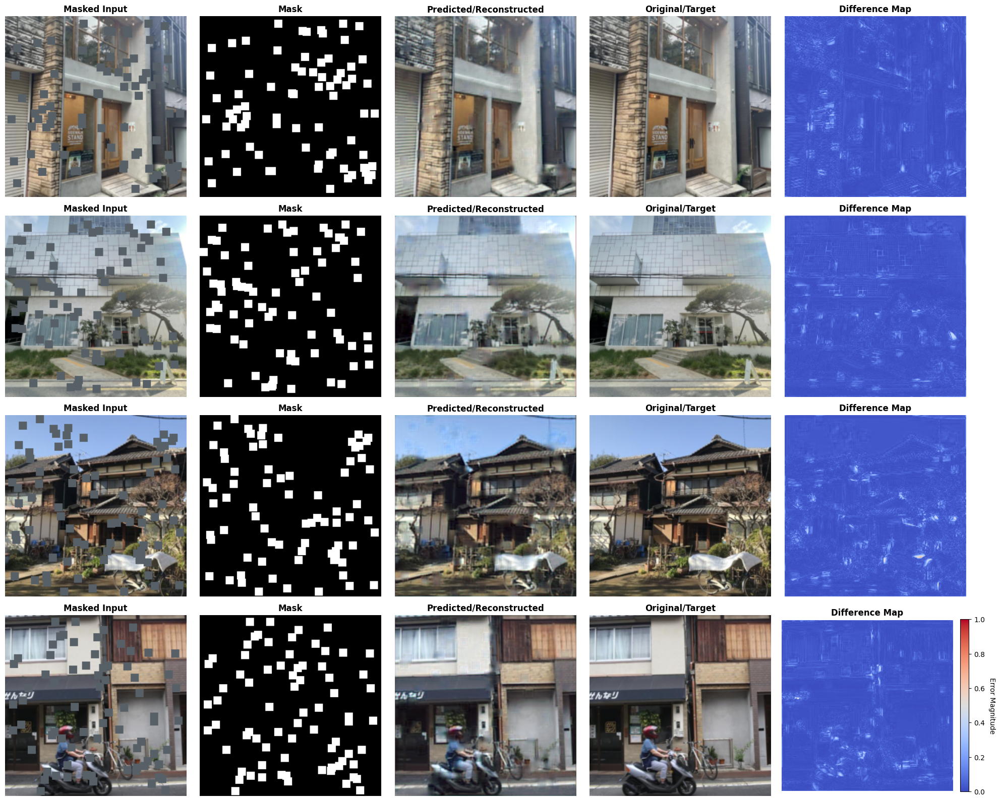

Results saved to 'inpainting_results.png'
✓ Completed visualization for random mode


Visualizing results for: GRID mode



Repo card metadata block was not found. Setting CardData to empty.


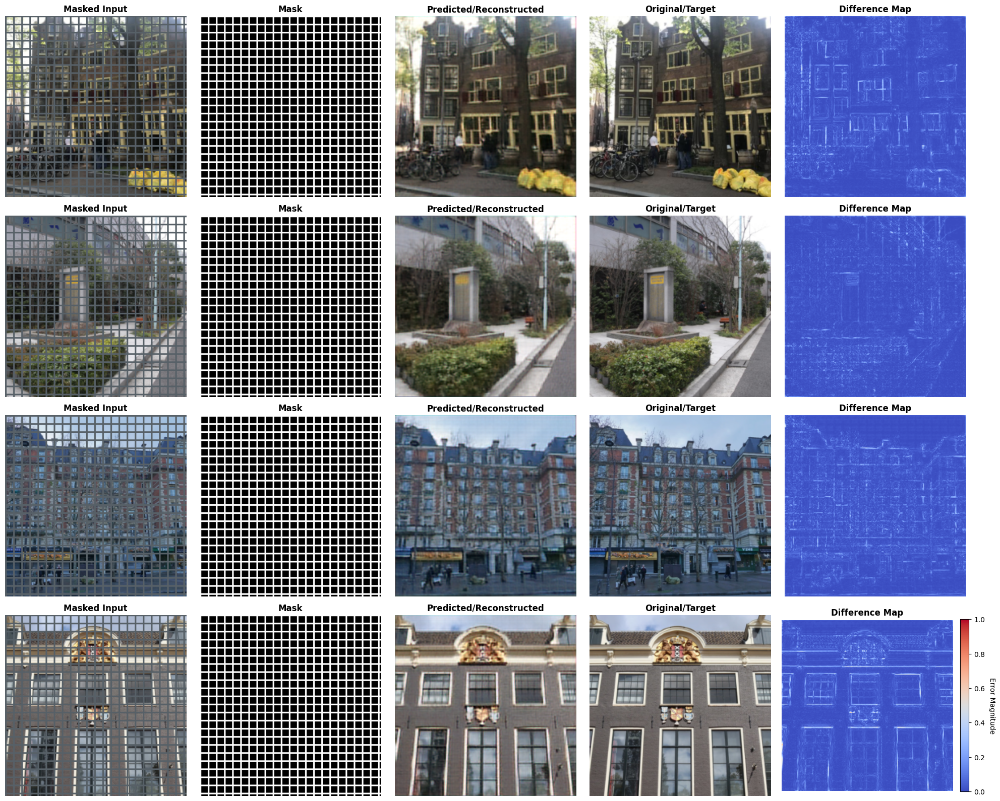

Results saved to 'inpainting_results.png'
✓ Completed visualization for grid mode


Visualizing results for: DIAGONALS mode



Repo card metadata block was not found. Setting CardData to empty.


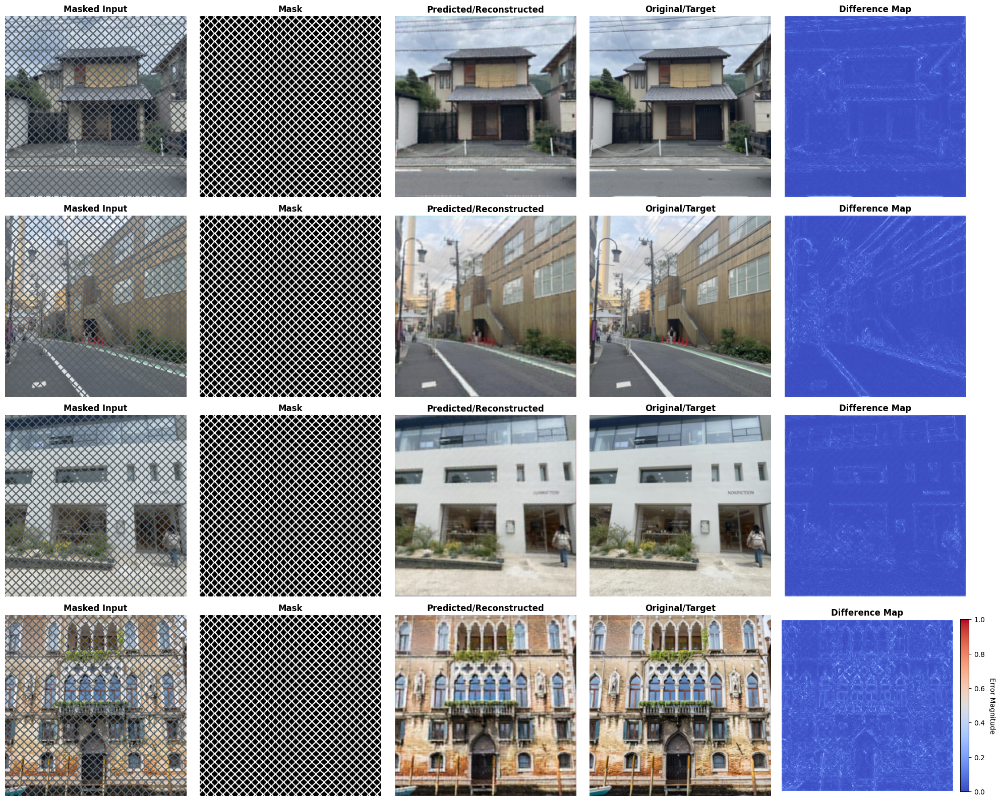

Results saved to 'inpainting_results.png'
✓ Completed visualization for diagonals mode

All visualizations complete!


In [19]:
import torch

sprinkle_modes = ["random", "grid", "diagonals"]
device = 'cuda' if torch.cuda.is_available() else 'cpu'

for mode in sprinkle_modes:
    print(f"\n{'='*60}")
    print(f"Visualizing results for: {mode.upper()} mode")
    print(f"{'='*60}\n")
    
    # Load model checkpoint for this mode
    checkpoint_path = f'denoising_mode_{mode}/version_0/checkpoints/best_valid_loss.ckpt'
    model = LightningModule.load_from_checkpoint(checkpoint_path)
    
    # Load data with the same sprinkle mode used for training
    data_module = DataModule(
        dataset_name='urbanstevie/reference_dataset', 
        bs=64,
        sprinkles_mode=mode
    )
    data_module.setup()
    
    # Visualize results
    visualize_inpainting(
        model=model,
        dataloader=data_module.test_dataloader(),
        device=device,
        num_images=4
    )
    
    print(f"✓ Completed visualization for {mode} mode\n")

print(f"{'='*60}")
print("All visualizations complete!")
print(f"{'='*60}")

In [20]:
import os
from PIL import Image
import torch
from torch.utils.data import Dataset
import numpy as np
import pytorch_lightning as pl
from torch.utils.data import DataLoader
from torchvision.transforms import v2

class SegmentationDataset(Dataset):
    def __init__(self, images_dir, labels_dir, transforms=None):
        self.images_dir = images_dir
        self.labels_dir = labels_dir
        self.transforms = transforms
        # Only list image files
        self.image_files = sorted(
            [f for f in os.listdir(images_dir) if f.lower().endswith(".jpg")]
        )
    
    def __len__(self):
        return len(self.image_files)
    
    def __getitem__(self, idx):
        img_name = self.image_files[idx]
        base_name = os.path.splitext(img_name)[0]
        img_path = os.path.join(self.images_dir, img_name)
        label_path = os.path.join(self.labels_dir, base_name + ".png")
        
        # Load image and mask
        image = Image.open(img_path).convert("RGB")
        mask = Image.open(label_path).convert("L")  # binary mask
        
        # Apply transforms to image
        if self.transforms:
            image = self.transforms(image)
        
        # Process mask: resize to match image, convert to tensor
        mask = mask.resize((224, 224), Image.NEAREST)  # Match your model's input size
        mask = np.array(mask, dtype=np.float32) / 255.0
        mask = torch.from_numpy(mask).unsqueeze(0)  # Add channel dimension [1, H, W]
        
        # Ensure binary mask
        mask = (mask > 0.5).float()
        
        # Create masked image by zeroing out masked regions
        # Invert mask: 1 where we keep, 0 where we mask out
        inverse_mask = 1 - mask
        masked_image = image * inverse_mask
        
        return {
            'masked_image': masked_image,  # Input: image with masked regions zeroed
            'original_image': image,       # Target: original complete image
            'mask': mask                   # Mask: 1 where masked, 0 elsewhere
        }


class SegmentationDataModule(pl.LightningDataModule):
    def __init__(self, data_dir, batch_size=4, num_workers=4):
        super().__init__()
        self.data_dir = data_dir
        self.batch_size = batch_size
        self.num_workers = num_workers
        
        # Define the same transforms used in training
        self.transforms = v2.Compose([
            v2.ToImage(), 
            v2.Resize(256),
            v2.CenterCrop(224),
            v2.ToDtype(torch.float32, scale=True),
            v2.Normalize(
                mean=[0.34437724, 0.38029198, 0.40777111], 
                std=[0.20265734, 0.13689059, 0.11554374]
            )
        ])
    
    def setup(self, stage=None):
        self.train_dataset = SegmentationDataset(
            images_dir=os.path.join(self.data_dir, "Training Set", "Training_Images"),
            labels_dir=os.path.join(self.data_dir, "Training Set", "Training_Labels"),
            transforms=self.transforms
        )
        self.test_dataset = SegmentationDataset(
            images_dir=os.path.join(self.data_dir, "Test Set", "Test_Images"),
            labels_dir=os.path.join(self.data_dir, "Test Set", "Test_Labels"),
            transforms=self.transforms
        )
    
    def train_dataloader(self):
        return DataLoader(
            self.train_dataset,
            batch_size=self.batch_size,
            shuffle=True,
            num_workers=self.num_workers,
        )
    
    def test_dataloader(self):
        return DataLoader(
            self.test_dataset,
            batch_size=self.batch_size,
            shuffle=False,
            num_workers=self.num_workers,
        )

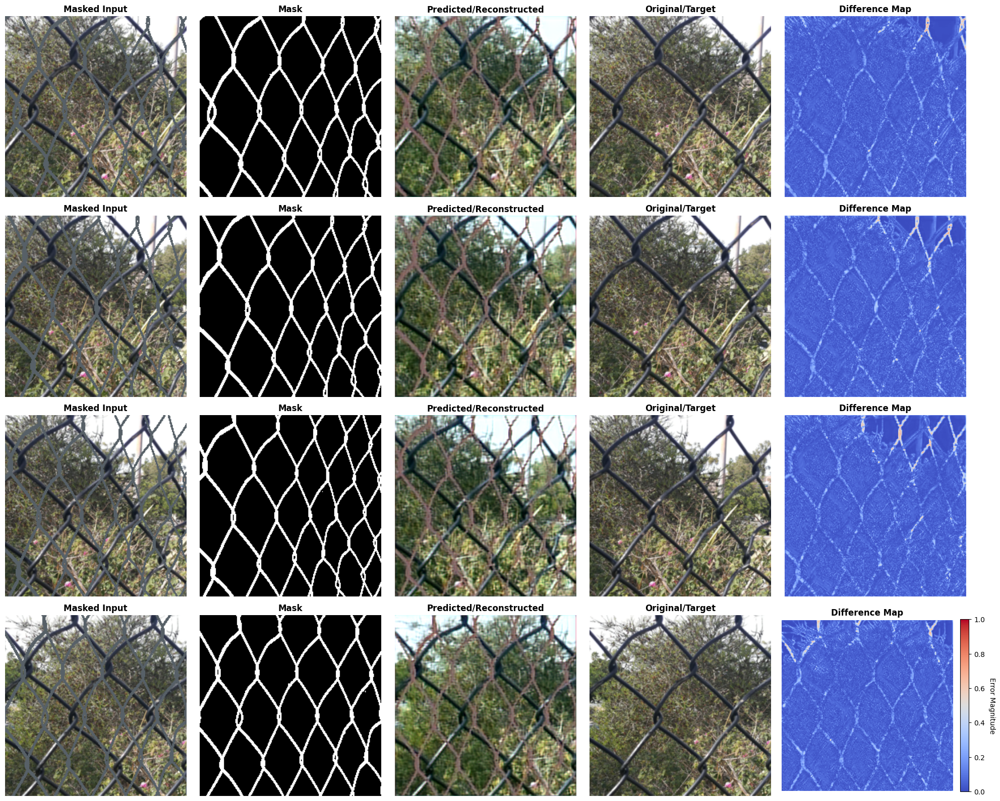

Results saved to 'inpainting_results.png'


In [22]:
# Load the diagonals checkpoint
checkpoint_path = 'denoising_mode_diagonals/version_0/checkpoints/best_valid_loss.ckpt'
model = LightningModule.load_from_checkpoint(checkpoint_path)

# Load your segmentation dataset
data_module = SegmentationDataModule(
    data_dir='dataset',
    batch_size=4
)
data_module.setup()

# Visualize results
device = 'cuda' if torch.cuda.is_available() else 'cpu'
visualize_inpainting(
    model=model,
    dataloader=data_module.test_dataloader(),
    device=device,
    num_images=4
)